In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os                       # for working with files
import numpy as np              # for numerical computationss
import pandas as pd             # for working with dataframes
import torch                    # Pytorch module 
import matplotlib.pyplot as plt # for plotting informations on graph and images using tensors
import torch.nn as nn           # for creating  neural networks
from torch.utils.data import DataLoader # for dataloaders 
from PIL import Image           # for checking images
import torch.nn.functional as F # for functions for calculating loss
import torchvision.transforms as transforms   # for transforming images into tensors 
from torchvision.utils import make_grid       # for data checking
from torchvision.datasets import ImageFolder  # for working with classes and images
from torchsummary import summary              # for getting the summary of our model
import cv2
%matplotlib inline

In [8]:
data_dir = "/content/drive/MyDrive/Data/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)"
train_dir = data_dir + "/train"
valid_dir = data_dir + "/valid"
diseases = os.listdir(train_dir)

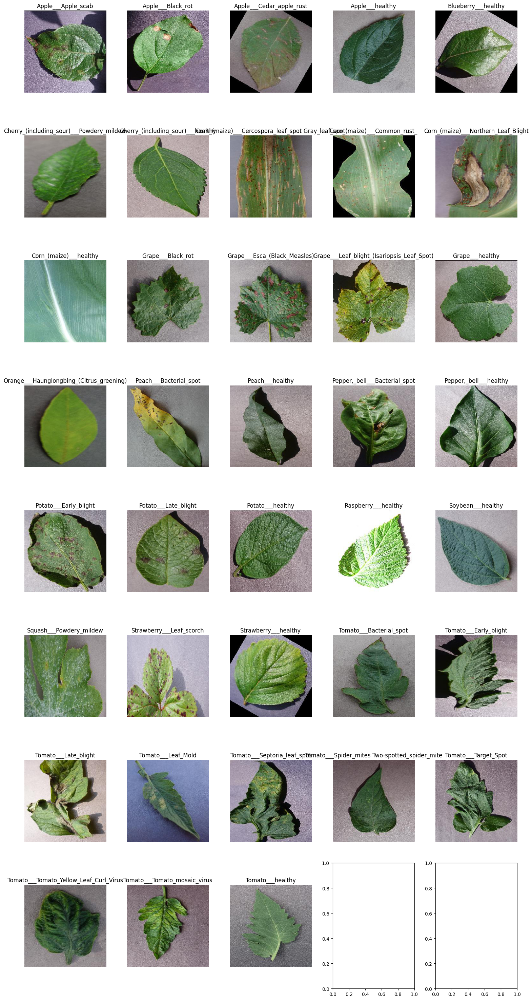

In [9]:
# Function to display images in a grid with class names
def show_images(images, class_names, n_images_per_row=5):
    fig, axs = plt.subplots(nrows=int(np.ceil(len(images) / n_images_per_row)), ncols=n_images_per_row, figsize=(15, 30))
    axs = axs.flatten()
    for img, class_name, ax in zip(images, class_names, axs):
        ax.imshow(img)
        ax.set_title(class_name)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Load one image from each class
images = []
for disease in diseases:
    class_dir = os.path.join(train_dir, disease)
    img_name = os.listdir(class_dir)[0]  # Select the first image in the folder
    img_path = os.path.join(class_dir, img_name)
    img = Image.open(img_path)
    images.append(img)

# Display images in a grid with class names
show_images(images, diseases)

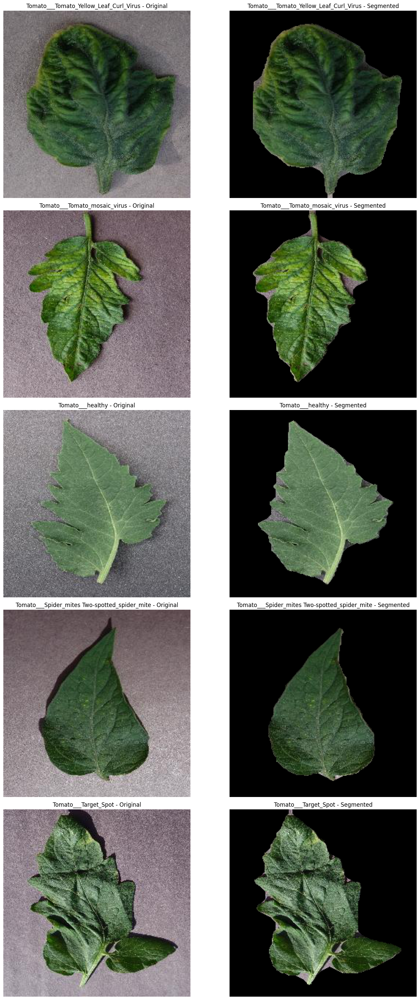

In [10]:
# comparing original and blacl background images
import cv2
import numpy as np
from PIL import Image

def show_images(original_images, segmented_images, class_names, n_images_per_row=5):
    fig, axs = plt.subplots(nrows=int(np.ceil(len(original_images) / n_images_per_row)), ncols=n_images_per_row * 2, figsize=(15, 30))
    axs = axs.flatten()
    for orig_img, seg_img, class_name, ax1, ax2 in zip(original_images, segmented_images, class_names, axs[0::2], axs[1::2]):
        ax1.imshow(orig_img)
        ax1.set_title(class_name + " - Original")
        ax1.axis('off')
        
        ax2.imshow(seg_img)
        ax2.set_title(class_name + " - Segmented")
        ax2.axis('off')
    plt.tight_layout()
    plt.show()

def compare_images(original_images, segmented_images, class_names, n_images_per_col=5):
    n_images = len(original_images)
    fig, axs = plt.subplots(nrows=n_images_per_col, ncols=2, figsize=(15, 30))
    
    for i, (orig_img, seg_img, class_name) in enumerate(zip(original_images, segmented_images, class_names)):
        row = i % n_images_per_col
        axs[row, 0].imshow(orig_img)
        axs[row, 0].set_title(class_name + " - Original")
        axs[row, 0].axis('off')
        
        axs[row, 1].imshow(seg_img)
        axs[row, 1].set_title(class_name + " - Segmented")
        axs[row, 1].axis('off')
    
    # Hide unused axes
    for i in range(len(class_names), n_images_per_col):
        axs[i, 0].axis('off')
        axs[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

def leaf_segmentation(image):
    # Convert the image to OpenCV format
    image = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)

    # Convert the image to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define color range for the leaf
    lower_green = np.array([25, 40, 40])
    upper_green = np.array([100, 255, 255])

    # Create a mask for the leaf
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Perform morphological operations to fill small holes
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    closing = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=5)

    # Find contours in the mask
    contours, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create an empty mask for the largest contour
    largest_contour_mask = np.zeros_like(mask)

    # Find the largest contour by area
    largest_contour = max(contours, key=cv2.contourArea)

    # Draw the largest contour on the empty mask
    cv2.drawContours(largest_contour_mask, [largest_contour], -1, 255, -1)

    # Perform opening on the largest contour mask to remove small background parts near the edges
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    opened_mask = cv2.morphologyEx(largest_contour_mask, cv2.MORPH_OPEN, kernel, iterations=1)

    # Apply the opened mask to the image
    leaf_only = cv2.bitwise_and(image, image, mask=opened_mask)

    # Convert the image back to PIL format
    leaf_only = Image.fromarray(cv2.cvtColor(leaf_only, cv2.COLOR_BGR2RGB))

    return leaf_only

# Apply the leaf_segmentation function to the images
segmented_images = [leaf_segmentation(img) for img in images]

# Display images in a grid with class names
#show_images(images, segmented_images, diseases)
compare_images(images, segmented_images, diseases)

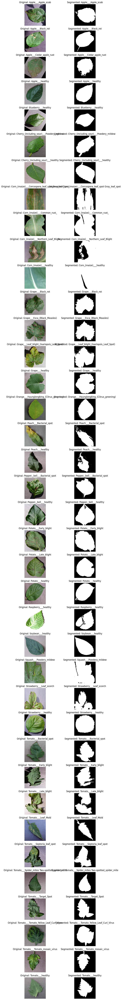

In [11]:
# creating binary masked images
from scipy import ndimage

def binary_segmentation(image, lower_hsv_bound=np.array([25, 30, 30]), upper_hsv_bound=np.array([100, 255, 255])):
    # Convert to HSV color space
    hsv_image = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2HSV)
    
    # Create a mask based on the specified HSV range
    mask = cv2.inRange(hsv_image, lower_hsv_bound, upper_hsv_bound)

    # Fill holes in the binary mask
    filled_mask = ndimage.binary_fill_holes(mask).astype(np.uint8) * 255

    return Image.fromarray(filled_mask)

images = []
for disease in diseases:
    disease_dir = os.path.join(train_dir, disease)
    image_path = os.path.join(disease_dir, os.listdir(disease_dir)[0])
    image = Image.open(image_path)
    images.append(image)

segmented_images = [binary_segmentation(image) for image in images]

fig, axes = plt.subplots(len(diseases), 2, figsize=(10, len(diseases) * 2))
for i, (original, segmented) in enumerate(zip(images, segmented_images)):
    axes[i, 0].imshow(original)
    axes[i, 0].axis('off')
    axes[i, 0].set_title(f'Original: {diseases[i]}')
    
    axes[i, 1].imshow(segmented, cmap='gray')
    axes[i, 1].axis('off')
    axes[i, 1].set_title(f'Segmented: {diseases[i]}')

plt.tight_layout()
plt.show()

In [ ]:
import os

# Create a new directory to store the segmented images
segmented_dir = data_dir + "/segmented"
if not os.path.exists(segmented_dir):
    os.makedirs(segmented_dir)

# Get the last 10 classes of diseases
last_10_diseases = diseases[-10:]

# Loop through the last 10 classes
for disease in last_10_diseases:
    print(f"Processing {disease} images...")
    
    # Create a new directory for the segmented images of the current class
    segmented_class_dir = os.path.join(segmented_dir, disease)
    if not os.path.exists(segmented_class_dir):
        os.makedirs(segmented_class_dir)
    
    # Get the original images directory for the current class
    original_class_dir = os.path.join(train_dir, disease)
    
    # Loop through all images in the current class
    for img_name in os.listdir(original_class_dir):
        # Load the image
        img_path = os.path.join(original_class_dir, img_name)
        image = Image.open(img_path)
        
        # Apply binary segmentation with fill holes filter
        segmented_image = binary_segmentation(image)
        
        # Save the segmented image to the new directory
        segmented_image_path = os.path.join(segmented_class_dir, img_name)
        segmented_image.save(segmented_image_path)

print("Segmentation and saving completed.")

Processing Tomato___Bacterial_spot images...
Processing Tomato___Early_blight images...
Processing Tomato___Late_blight images...
Processing Tomato___Leaf_Mold images...
Processing Tomato___Septoria_leaf_spot images...
Processing Tomato___Spider_mites Two-spotted_spider_mite images...
Processing Tomato___Target_Spot images...
Processing Tomato___Tomato_Yellow_Leaf_Curl_Virus images...
Processing Tomato___Tomato_mosaic_virus images...
Processing Tomato___healthy images...
Segmentation and saving completed.
